# Fitting MF (or other) datasets
12/09/22

For the basic (default) case, using AF data, see the [basic demo notebook](https://pemtk.readthedocs.io/en/latest/fitting/PEMtk_fitting_basic_demo_030621-full.html) and [PEMtk fitting setup & batch run demo notebook](https://pemtk.readthedocs.io/en/latest/fitting/PEMtk_fitting_demo_multi-fit_tests_130621-para_010922.html). This notebook is based on the latter, but demonstrates additionally:

- Switching the fit dataset to use MF data as a function of polarization (as opposed to AF data as a function of alignment/time in the earlier demo case).
- Switching the backend to calculate MFPADs (see the [backends notebook](https://pemtk.readthedocs.io/en/latest/fitting/PEMtk_fitting_backends_demo_010922.html) for more).
- Running fits.

Note that the methods here should be general, allowing for fitting of MF or AF/LF data vs. alignment, time, energy or polarization geometry depending on the dataset.


## Setup

Here we'll use the demo script, as per the [PEMtk fitting setup & batch run demo notebook](https://pemtk.readthedocs.io/en/latest/fitting/PEMtk_fitting_demo_multi-fit_tests_130621-para_010922.html), then replace some of the defaults later. Alternatively, the MF case could be setup from scratch following the [basic demo notebook](https://pemtk.readthedocs.io/en/latest/fitting/PEMtk_fitting_basic_demo_030621-full.html).

*** ePSproc installation not found, setting for local copy.


* Setting plotter defaults with epsproc.basicPlotters.setPlotters(). Run directly to modify, or change options in local env.


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
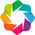

* Set Holoviews with bokeh.


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
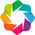

C:\Users\femtolab\.conda\envs\ePSdev\lib\site-packages\xyzpy\plot\xyz_cmaps.py:6: MatplotlibDeprecationWarning: 
The revcmap function was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use Colormap.reversed() instead.
  return LinearSegmentedColormap(name, cm.revcmap(cmap._segmentdata))


*** Setting up demo fitting workspace and main `data` class object...
For more details see https://pemtk.readthedocs.io/en/latest/fitting/PEMtk_fitting_basic_demo_030621-full.html
To use local source code, pass the parent path to this script at run time, e.g. "setup_fit_demo ~/github"


* Loading packages...


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
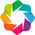

* Set Holoviews with bokeh.

* Loading demo matrix element data from D:\code\github\ePSproc\data\photoionization\n2_multiorb...

*** Job subset details
Key: subset
No 'job' info set for self.data[subset].

*** Job orb6 details
Key: orb6
Dir D:\code\github\ePSproc\data\photoionization\n2_multiorb, 1 file(s).
{   'batch': 'ePS n2, batch n2_1pu_0.1-50.1eV, orbital A2',
    'event': ' N2 A-state (1piu-1)',
    'orbE': -17.096913836366,
    'orbLabel': '1piu-1'}

*** Job orb5 details
Key: orb5
Dir D:\code\github\ePSproc\data\photoionization\n2_multiorb, 1 file(s).
{   'batch': 'ePS n2, batch n2_3sg_0.1-50.1eV, orbital A2',
    'event': ' N2 X-state (3sg-1)',
    'orbE': -17.341816310545997,
    'orbLabel': '3sg-1'}


* Loading demo ADM data from D:\code\github\ePSproc\data\alignment\N2_ADM_VM_290816.mat...

* Subselecting data...
Subselected from dataset 'orb5', dataType 'matE': 36 from 11016 points (0.33%)
Subselected from dataset 'pol', dataType 'pol': 1 from 3 points (33.33%)
Subselected

C:\Users\femtolab\.conda\envs\ePSdev\lib\site-packages\pandas\core\generic.py:3939: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._update_inplace(obj)


Auto-setting parameters.


name,value,initial value,min,max,vary,expression
m_PU_SG_PU_1_n1_1_1,1.78461575,1.784615753610107,1.0000e-04,5.00000000,True,
m_PU_SG_PU_1_1_n1_1,1.78461575,1.784615753610107,1.0000e-04,5.00000000,False,m_PU_SG_PU_1_n1_1_1
m_PU_SG_PU_3_n1_1_1,0.80290495,0.802904951323892,1.0000e-04,5.00000000,True,
m_PU_SG_PU_3_1_n1_1,0.80290495,0.802904951323892,1.0000e-04,5.00000000,False,m_PU_SG_PU_3_n1_1_1
m_SU_SG_SU_1_0_0_1,2.68606212,2.686062120382649,1.0000e-04,5.00000000,True,
m_SU_SG_SU_3_0_0_1,1.10915311,1.109153108617096,1.0000e-04,5.00000000,True,
p_PU_SG_PU_1_n1_1_1,-0.86104140,-0.8610414024232179,-3.14159265,3.14159265,False,
p_PU_SG_PU_1_1_n1_1,-0.86104140,-0.8610414024232179,-3.14159265,3.14159265,False,p_PU_SG_PU_1_n1_1_1
p_PU_SG_PU_3_n1_1_1,-3.12044446,-3.1204444620772467,-3.14159265,3.14159265,True,
p_PU_SG_PU_3_1_n1_1,-3.12044446,-3.1204444620772467,-3.14159265,3.14159265,False,p_PU_SG_PU_3_n1_1_1




*** Setup demo fitting workspace OK.


In [1]:
# Import & set paths
import pemtk
from pemtk.fit.fitClass import pemtkFit

from pathlib import Path

# Path for demo script
demoPath = Path(pemtk.__file__).parent.parent/Path('demos','fitting')

# Run demo script to configure workspace
%run {demoPath/"setup_fit_demo.py"}

### Default AF case

As shown above, the demo script set some AF fitting defaults. These are also shown in some of the optional settings...

In [2]:
data.selOpts

{'matE': {'thres': 0.01, 'inds': {'Type': 'L', 'Eke': 1.1}},
 'slices': {'t': [4, 5, 4]},
 'pol': {'inds': {'Labels': 'z'}},
 'ADM': {},
 'AFBLM': {}}

In [3]:
# data.fitOpts['backend'].__name__
data.backend

'afblmXprod'

In [4]:
# Data is set as AFBLMs, vs. time
data.data['subset']['AFBLM']

<xarray.DataArray (Labels: 1, t: 13, BLM: 15)>
array([[[ 0.00000000e+00+0.00000000e+00j,
          1.66882312e+00+5.78828173e-18j,
          0.00000000e+00+0.00000000e+00j,
          0.00000000e+00+0.00000000e+00j,
          9.25154735e-01-2.04255472e-18j,
          0.00000000e+00+0.00000000e+00j,
          0.00000000e+00+0.00000000e+00j,
          0.00000000e+00+0.00000000e+00j,
          0.00000000e+00+0.00000000e+00j,
          0.00000000e+00+0.00000000e+00j,
         -1.45626494e-01-2.50162312e-18j,
          0.00000000e+00+0.00000000e+00j,
          0.00000000e+00+0.00000000e+00j,
          9.05679279e-03+2.69005757e-19j,
          0.00000000e+00+0.00000000e+00j],
        [ 0.00000000e+00+0.00000000e+00j,
          1.65939046e+00-7.23129056e-18j,
          0.00000000e+00+0.00000000e+00j,
          0.00000000e+00+0.00000000e+00j,
          9.28209270e-01-1.20305969e-17j,
          0.00000000e+00+0.00000000e+00j,
          0.00000000e+00+0.00000000e+00j,
          0.00000000e+00+0.00000000e+00j,
          0.00000000e+00+0.00000000e+00j,
          0.00000000e+00+0.00000000e+00j,
         -1.35884180e-01+7.60995910e-18j,
          0.00000000e+00+0.00000000e+00j,
          0.00000000e+00+0.00000000e+00j,
          7.87360160e-03-5.26232236e-19j,
          0.00000000e+00+0.00000000e+00j],
        [ 0.00000000e+00+0.00000000e+00j,
          1.60819595e+00+5.37946903e-19j,
          0.00000000e+00+0.00000000e+00j,
          0.00000000e+00+0.00000000e+00j,
          9.44773203e-01+2.80576809e-17j,
          0.00000000e+00+0.00000000e+00j,
          0.00000000e+00+0.00000000e+00j,
          0.00000000e+00+0.00000000e+00j,
          0.00000000e+00+0.00000000e+00j,
          0.00000000e+00+0.00000000e+00j,
         -8.24684513e-02-1.29331051e-18j,
          0.00000000e+00+0.00000000e+00j,
          0.00000000e+00+0.00000000e+00j,
          1.24796733e-03+1.99111244e-19j,
          0.00000000e+00+0.00000000e+00j],
        [ 0.00000000e+00+0.00000000e+00j,
          1.52326324e+00-1.50526506e-18j,
          0.00000000e+00+0.00000000e+00j,
          0.00000000e+00+0.00000000e+00j,
          9.72371636e-01+7.27400639e-19j,
          0.00000000e+00+0.00000000e+00j,
          0.00000000e+00+0.00000000e+00j,
          0.00000000e+00+0.00000000e+00j,
          0.00000000e+00+0.00000000e+00j,
          0.00000000e+00+0.00000000e+00j,
          4.93224211e-04+1.20678198e-18j,
          0.00000000e+00+0.00000000e+00j,
          0.00000000e+00+0.00000000e+00j,
         -5.69662854e-03-1.12782141e-19j,
          0.00000000e+00+0.00000000e+00j],
        [ 0.00000000e+00+0.00000000e+00j,
          1.43634451e+00+9.52773406e-18j,
          0.00000000e+00+0.00000000e+00j,
          0.00000000e+00+0.00000000e+00j,
          1.00104159e+00+2.33569626e-17j,
          0.00000000e+00+0.00000000e+00j,
          0.00000000e+00+0.00000000e+00j,
          0.00000000e+00+0.00000000e+00j,
          0.00000000e+00+0.00000000e+00j,
          0.00000000e+00+0.00000000e+00j,
          6.53535497e-02-2.06092931e-18j,
          0.00000000e+00+0.00000000e+00j,
          0.00000000e+00+0.00000000e+00j,
          1.13815711e-03-3.50093184e-18j,
          0.00000000e+00+0.00000000e+00j],
        [ 0.00000000e+00+0.00000000e+00j,
          1.38620024e+00+9.20243198e-19j,
          0.00000000e+00+0.00000000e+00j,
          0.00000000e+00+0.00000000e+00j,
          1.01780024e+00-1.33980425e-18j,
          0.00000000e+00+0.00000000e+00j,
          0.00000000e+00+0.00000000e+00j,
          0.00000000e+00+0.00000000e+00j,
          0.00000000e+00+0.00000000e+00j,
          0.00000000e+00+0.00000000e+00j,
          9.28414140e-02+2.05936950e-18j,
          0.00000000e+00+0.00000000e+00j,
          0.00000000e+00+0.00000000e+00j,
          1.15029998e-02-1.86868078e-18j,
          0.00000000e+00+0.00000000e+00j],
        [ 0.00000000e+00+0.00000000e+00j,
          1.39472246e+00-4.45373740e-18j,
          0.00000000e+00+0.00000000e+00j,
          0.00000000e+00+0.00000000e+00j,

## Set the (MF) data to fit

Here we'll calculate some MF-$\beta_{LM}$ parameters to use as the test data. Note this currently needs to be set as `self.data['subset']['AFBLM']` for fitting (even if it's a different datatype).

TODO: add dict key option here for different backends.

In [5]:
# For MF case remove the existing AFBLM and update pols (these are set in demo script.)
# And for the polarisation geometries...
data.selOpts['pol'] = {}
data.setSubset(dataKey = 'pol', dataType = 'pol')

# Delete ADMs, since we don't 
del(data.data['subset']['ADM'])


Subselected from dataset 'pol', dataType 'pol': 3 from 3 points (100.00%)


In [6]:
# Set the backend function, see https://pemtk.readthedocs.io/en/latest/fitting/PEMtk_fitting_backends_demo_010922.html

# 21/08/22 - Change backend in dict
# data.fitOpts = {'backend':data.backends(backend='mfblmXprod')}
# 01/09/22 - Change to direct setting via self.backends
data.backends(backend='mfblmXprod')

In [7]:
# Generate some data & update basis etc - now set by main fitting func.
# BLMtest, data.basis = data.afblmMatEfit(backend = ep.mfblmXprod, resetBasis = True)   # With backend by object
BLMtest, data.basis = data.afblmMatEfit(resetBasis = True)   # 21/08/22 With backend as set in data.fitOpts

data.setData('sim', BLMtest)  # Set simulated data to master structure as "sim"
data.setSubset('sim','AFBLM')   # Set to 'subset' to use for fitting.

Subselected from dataset 'sim', dataType 'AFBLM': 75 from 75 points (100.00%)


In [8]:
# Show the data
data.data['subset']['AFBLM']

<xarray.DataArray (Labels: 3, BLM: 25)>
array([[ 0.00000000e+00+0.00000000e+00j,  0.00000000e+00+0.00000000e+00j,
         1.00000000e+00+0.00000000e+00j,  0.00000000e+00+0.00000000e+00j,
         0.00000000e+00+0.00000000e+00j,  0.00000000e+00+0.00000000e+00j,
         0.00000000e+00+0.00000000e+00j,  2.93448657e-01+0.00000000e+00j,
         0.00000000e+00+0.00000000e+00j,  0.00000000e+00+0.00000000e+00j,
         0.00000000e+00+0.00000000e+00j,  0.00000000e+00+0.00000000e+00j,
         3.60745890e-34+0.00000000e+00j,  0.00000000e+00+0.00000000e+00j,
         0.00000000e+00+0.00000000e+00j,  0.00000000e+00+0.00000000e+00j,
         0.00000000e+00+0.00000000e+00j, -4.74637872e-01+0.00000000e+00j,
         0.00000000e+00+0.00000000e+00j,  0.00000000e+00+0.00000000e+00j,
         0.00000000e+00+0.00000000e+00j,  0.00000000e+00+0.00000000e+00j,
         1.22430606e-01+0.00000000e+00j,  0.00000000e+00+0.00000000e+00j,
         0.00000000e+00+0.00000000e+00j],
       [ 0.00000000e+00+0.00000000e+00j,  0.00000000e+00+0.00000000e+00j,
         1.00000000e+00+0.00000000e+00j,  0.00000000e+00+0.00000000e+00j,
         0.00000000e+00+0.00000000e+00j,  5.86599819e-01+0.00000000e+00j,
         0.00000000e+00+0.00000000e+00j, -6.37672502e-01+0.00000000e+00j,
         0.00000000e+00+0.00000000e+00j,  5.86599819e-01+0.00000000e+00j,
         0.00000000e+00+0.00000000e+00j,  0.00000000e+00+0.00000000e+00j,
         0.00000000e+00+0.00000000e+00j,  0.00000000e+00+0.00000000e+00j,
         0.00000000e+00+0.00000000e+00j, -1.52557403e-01+0.00000000e+00j,
         0.00000000e+00+0.00000000e+00j,  2.69489335e-01+0.00000000e+00j,
         0.00000000e+00+0.00000000e+00j, -1.52557403e-01+0.00000000e+00j,
         7.24876684e-02+0.00000000e+00j,  0.00000000e+00+0.00000000e+00j,
        -1.06111081e-01+0.00000000e+00j,  0.00000000e+00+0.00000000e+00j,
         7.24876684e-02+0.00000000e+00j],
       [ 0.00000000e+00+0.00000000e+00j,  0.00000000e+00+0.00000000e+00j,
         1.00000000e+00+0.00000000e+00j,  0.00000000e+00+0.00000000e+00j,
         0.00000000e+00+0.00000000e+00j, -5.86599819e-01+7.81830424e-17j,
         0.00000000e+00+0.00000000e+00j, -6.37672502e-01+0.00000000e+00j,
         0.00000000e+00+0.00000000e+00j, -5.86599819e-01-7.81830424e-17j,
         0.00000000e+00+0.00000000e+00j,  0.00000000e+00+0.00000000e+00j,
         0.00000000e+00+0.00000000e+00j,  0.00000000e+00+0.00000000e+00j,
         0.00000000e+00+0.00000000e+00j,  1.52557403e-01+5.92656783e-18j,
         0.00000000e+00+0.00000000e+00j,  2.69489335e-01+0.00000000e+00j,
         0.00000000e+00+0.00000000e+00j,  1.52557403e-01-5.92656783e-18j,
        -7.24876684e-02+8.87717911e-18j,  0.00000000e+00+0.00000000e+00j,
        -1.06111081e-01+0.00000000e+00j,  0.00000000e+00+0.00000000e+00j,
        -7.24876684e-02-8.87717911e-18j]])
Coordinates:
    Euler    (Labels) object (0.0, 0.0, 0.0) ... (1.5707963267948966, 1.5707963267948966, 0.0)
  * Labels   (Labels) <U18 'z' 'x' 'y'
    Ehv      float64 18.4
    Type     <U1 'L'
    Eke      float64 1.1
    SF       complex128 (2.2237521+3.6277801j)
    XS       (Labels) complex128 (2.3823329246612026+0j) ... (1.0802847552102302+0j)
  * BLM      (BLM) MultiIndex
  - l        (BLM) int64 0 0 0 0 0 2 2 2 2 2 3 3 3 3 3 4 4 4 4 4 6 6 6 6 6
  - m        (BLM) int64 -2 -1 0 1 2 -2 -1 0 1 2 -2 ... -2 -1 0 1 2 -2 -1 0 1 2
Attributes:
    E:         0.1
    Ehv:       15.68
    SF:        (2.1560627+3.741674j)
    Lmax:      11
    Cont:      SU
    Targ:      SG
    Total:     SU
    QNs:       ['m', 'l', 'mu', 'ip', 'it', 'Value']
    dataType:  BLM
    file:      n2_3sg_0.1-50.1eV_A2.inp.out
    fileBase:  D:\code\github\ePSproc\data\photoionization\n2_multiorb
    fileList:  n2_3sg_0.1-50.1eV_A2.inp.out
    jobLabel:  3sg-1
    thres:     None

Note here there are 3 polarization geometries set, $(x,y,z)$, which is the default case. The MF backend generates only MF results (no alignment dependence). For a [quick intro to the MF and AF/LF calculations, see the ePSproc intro notes](https://epsproc.readthedocs.io/en/latest/demos/ePSproc_class_demo_161020.html#Compute-\beta_{LM}-parameters).

In [9]:
# Params should already be OK... (set by demo script)
data.params

name,value,initial value,min,max,vary,expression
m_PU_SG_PU_1_n1_1_1,1.78461575,1.784615753610107,1.0000e-04,5.00000000,True,
m_PU_SG_PU_1_1_n1_1,1.78461575,1.784615753610107,1.0000e-04,5.00000000,False,m_PU_SG_PU_1_n1_1_1
m_PU_SG_PU_3_n1_1_1,0.80290495,0.802904951323892,1.0000e-04,5.00000000,True,
m_PU_SG_PU_3_1_n1_1,0.80290495,0.802904951323892,1.0000e-04,5.00000000,False,m_PU_SG_PU_3_n1_1_1
m_SU_SG_SU_1_0_0_1,2.68606212,2.686062120382649,1.0000e-04,5.00000000,True,
m_SU_SG_SU_3_0_0_1,1.10915311,1.109153108617096,1.0000e-04,5.00000000,True,
p_PU_SG_PU_1_n1_1_1,-0.86104140,-0.8610414024232179,-3.14159265,3.14159265,False,
p_PU_SG_PU_1_1_n1_1,-0.86104140,-0.8610414024232179,-3.14159265,3.14159265,False,p_PU_SG_PU_1_n1_1_1
p_PU_SG_PU_3_n1_1_1,-3.12044446,-3.1204444620772467,-3.14159265,3.14159265,True,
p_PU_SG_PU_3_1_n1_1,-3.12044446,-3.1204444620772467,-3.14159265,3.14159265,False,p_PU_SG_PU_3_n1_1_1


## Running a fit...

With the parameters and data set, everything is as per the previous demos - just call `self.fit()` to run a fit!

Statistics and outputs are handled by lmfit, which includes uncertainty estimates and correlations in the fitted parameters.

In [10]:
# data.fit(fcn_kws = {'backend':ep.geomFunc.mfblmXprod})   # With backend by object
data.fit()   # 21/08/22 With backend as set in data.fitOpts

In [11]:
data.data.keys()

dict_keys(['subset', 'orb6', 'orb5', 'ADM', 'pol', 'sim', 0])

Note the new result appears in the main data dict by fit number, here `0`.

In [12]:
# Check fit outputs
fitInd = 0
data.data[fitInd]['results']

For this case, with correct inputs, correct outputs are quickly returned.

Plotting data n2_3sg_0.1-50.1eV_A2.inp.out, pType=a, thres=0.01, with Seaborn
Plotting data (No filename), pType=a, thres=0.01, with Seaborn


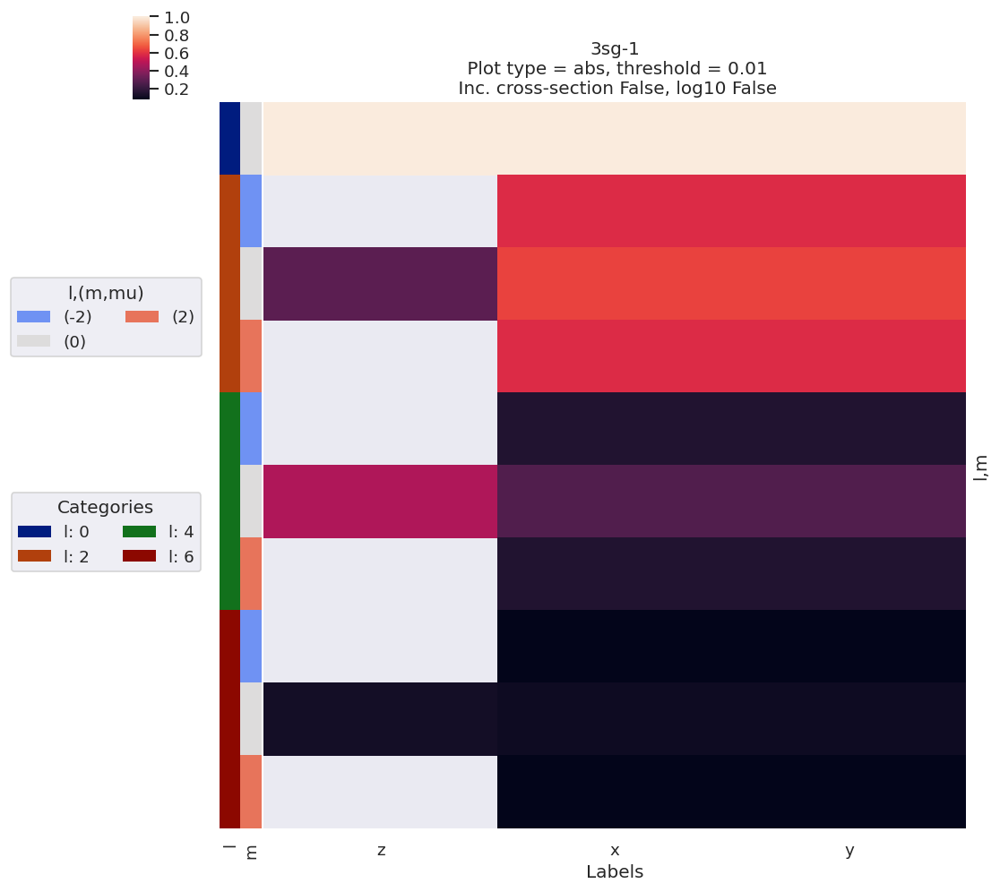

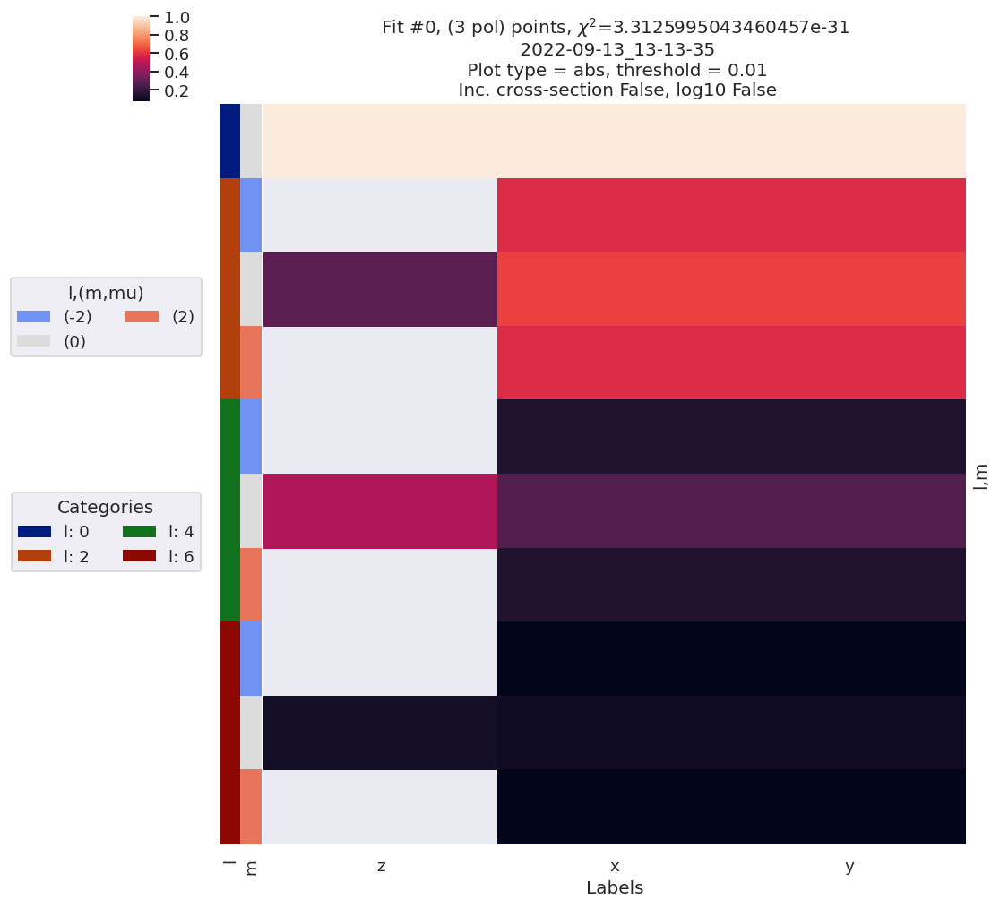

In [13]:
# Quick plot with lmPlotFit - this defaults to the reference case plus the last fit
data.lmPlotFit(Etype='Labels')

## Fit with randomized params...

The basic case above is a useful sanity check for the fitting routine. Now we can test from unknown (randomized) inputs to confirm that the fitting is actually useful...

Plotting data n2_3sg_0.1-50.1eV_A2.inp.out, pType=a, thres=0.01, with Seaborn
Plotting data (No filename), pType=a, thres=0.01, with Seaborn


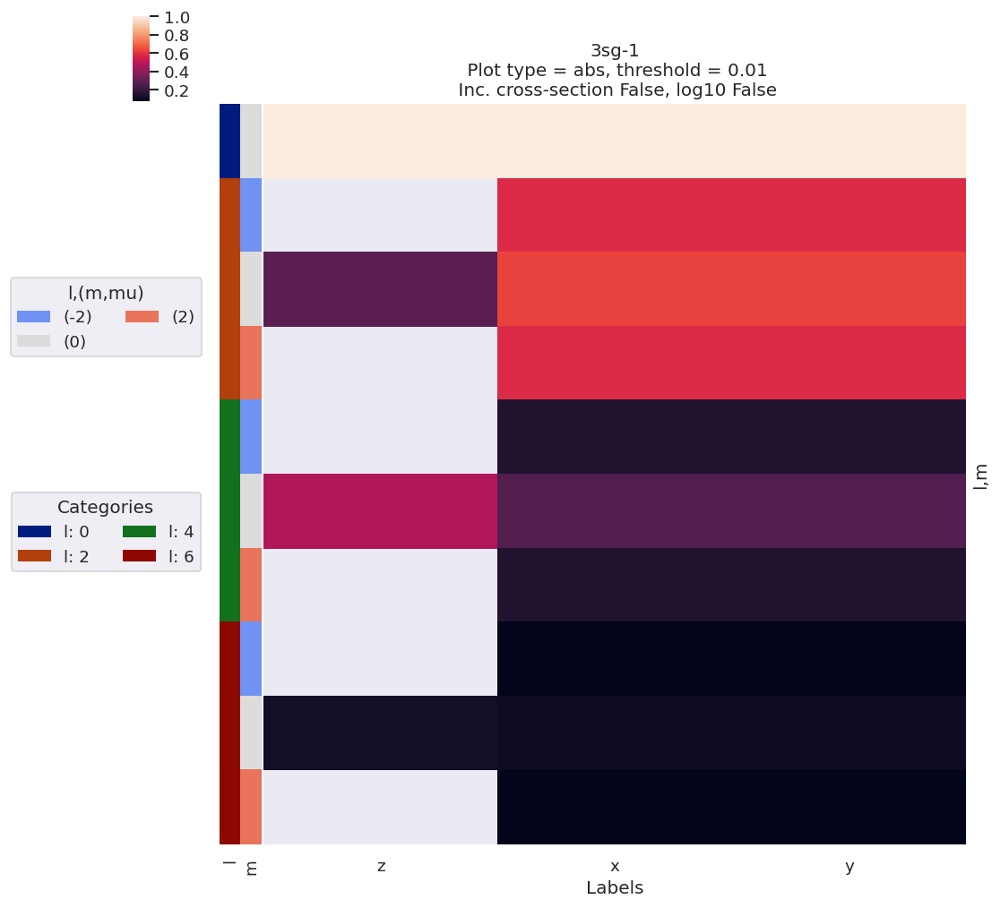

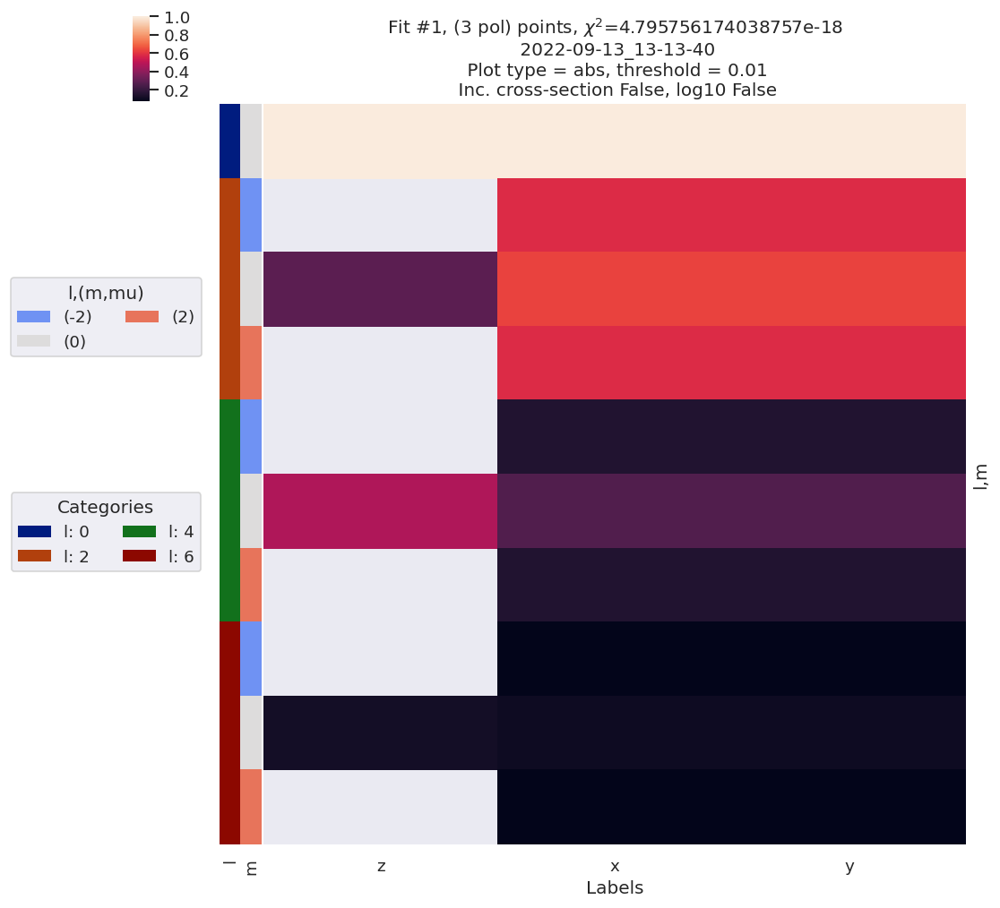

In [14]:
# Basic randomize routine, [0,1] interval for input parameter set
data.randomizeParams()

# data.fit(fcn_kws = {'backend':ep.geomFunc.mfblmXprod})   # With backend by object
data.fit()   # 21/08/22 With backend as set in data.fitOpts
data.lmPlotFit(Etype='Labels')

In [15]:
# Check fit outputs
data.data[data.fitInd]['results']

Note here that the $\chi^2$ looks good, as do the MF-$\beta_{LM}$, but the fitted parameters seem rather off from the reference case for the (m)agnitudes - this is because the input data was normalised by flux (i.e. $\beta_{0,0}=1$), so the fitting is only sensitive to relative magnitudes. The (p)hases, however, look good.

To get a better feel for this, run a batch of fits and look at the range of outputs more carefully...

## Test batch run (multiple fits) with noisey data

Parallel run, see [parallel execution](https://pemtk.readthedocs.io/en/latest/fitting/PEMtk_fitting_demo_multi-fit_tests_130621-para_010922.html#(2)-parallel-execution) for details.

In this test case, on an AMD Threadripper 2950X 16 core system, this took ~10 mins for 1000 fits.

In [16]:
# Add noise with np.random.normal
# https://numpy.org/doc/stable/reference/random/generated/numpy.random.normal.html
# data.data['subset']['AFBLM']

import numpy as np
mu, sigma = 0, 0.05  # Up to approx 10% noise (+/- 0.05)
# creating a noise with the same dimension as the dataset (2,2) 
noise = np.random.normal(mu, sigma, [data.data['subset']['AFBLM'].Labels.size, data.data['subset']['AFBLM'].l.size])
# data.BLMfitPlot()

# Set noise in Xarray & scale by l
import xarray as xr
noiseXR = xr.ones_like(data.data['subset']['AFBLM']) * noise
# data.data['subset']['AFBLM']['noise'] = ((data.data['subset']['AFBLM'].t, data.data['subset']['AFBLM'].l), noise)
# xr.where(noiseXR.l>0, noiseXR/noiseXR.l, noiseXR)
noiseXR = noiseXR.where(noiseXR.l<1, noiseXR/(noiseXR.l))  # Scale by L

data.data['subset']['AFBLM'] = data.data['subset']['AFBLM'] + noiseXR
data.data['subset']['AFBLM'] = data.data['subset']['AFBLM'].where(data.data['subset']['AFBLM'].m == 0, 0)

# data.BLMfitPlot(Etype='Labels', thres=None)

Set dataType (No dataType)
Plotting data (No filename), pType=a, thres=0.01, with Seaborn


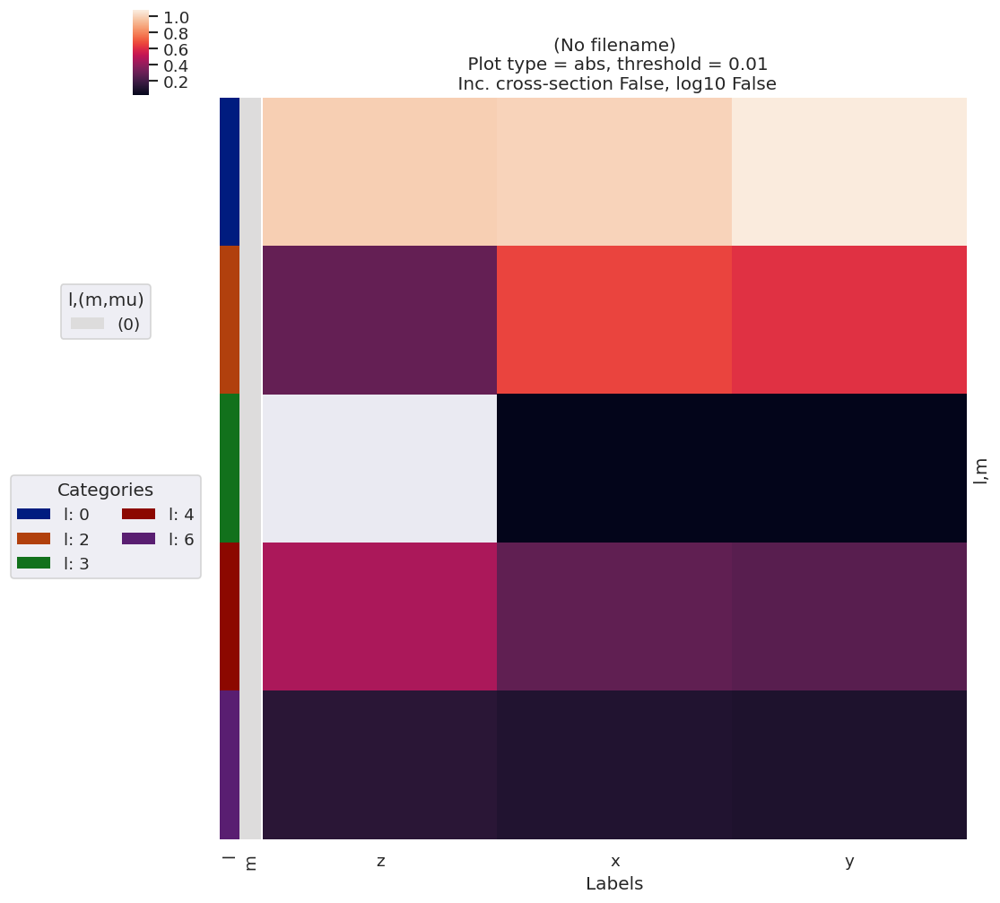

In [17]:
data.lmPlotFit(keys='subset',Etype='Labels')

In [18]:
data.multiFit(nRange = [0,1000])

100%|##############################################################################| 1000/1000 [13:33<00:00,  1.23it/s]


In [19]:
# Data IO with self.writeFitData()
# This will default to the working dir and set a data-stamped file name if nothing is passed.
data.writeFitData(outStem='dataDump_100fitTests_MFBLM_multiFit_noise-3')
# data.writeFitData()

# Runs
# 1. dataDump_100fitTests_MFBLM_multiFit_noise-3_130922_10-42-09.pickle
# 2. dataDump_100fitTests_MFBLM_multiFit_noise-3_130922_13-27-15.pickle

WindowsPath('D:/code/python/jupyterNotebooks/dev/PEMtk/fitting/MF_fit_dev_120822/dataDump_100fitTests_MFBLM_multiFit_noise-3_130922_13-27-15.pickle')

## Data overview

For more on the data structures used here, see the [setup & batch runs notebook](https://pemtk.readthedocs.io/en/latest/fitting/PEMtk_fitting_demo_multi-fit_tests_130621_r1000.html).

For more on the analysis routines, see the [fit fidelity](https://pemtk.readthedocs.io/en/latest/fitting/PEMtk_analysis_demo_150621-tidy.html) and [analysis routines](https://pemtk.readthedocs.io/en/latest/fitting/PEMtk_fitting_multiproc_class_analysis_141121-tidy.html) notebooks.


In [20]:
# Load data if required
# import pickle
# with open('dataDump_1000fitTests_MFBLM_multiFit_noise-1_220822.pickle', 'wb') as handle:
#     pickle.dump(data.data, handle, protocol=pickle.HIGHEST_PROTOCOL)

# data.loadFitData('dataDump_1000fitTests_MFBLM_multiFit_noise-1_220822.pickle') 

# data.loadFitData('dataDump_100fitTests_MFBLM_multiFit_noise-2_120922_19-34-54.pickle')

In [21]:
# Run basic stats
# TODO: add more outputs here & tidy up output formatting.
data.analyseFits(keyDims='Labels')

*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.


In [22]:
data.fitsSummary

{'Fits': 999,
 'Success': 999,
 'Minima': {'chisqr': 1.34668471213695, 'redchi': 0.019804186943190444},
 'Stats': {'chisqr': min       1.346685
  mean      1.359765
  median    1.346685
  max       2.961047
  std       0.074494
  var       0.005549
  Name: chisqr, dtype: float64,
  'redchi': min       0.019804
  mean      0.019997
  median    0.019804
  max       0.043545
  std       0.001096
  var       0.000001
  Name: redchi, dtype: float64}}

In [23]:
# Basic histogram of fit sets
# Note this defaults to Holoviews/Bokeh for plotting, which produces an interactive plot.
# Set backend = 'mpl' if Holoviews is not available.
data.fitHist(bins = 100)

:AdjointLayout
   :Scatter   [redchi]   (Fit)
   :Histogram   [Fit]   (Fit_count)
   :Histogram   [redchi]   (redchi_count)

In [39]:
# Try zooming in on the good results - note in this example case the spread is small!

# data.fitHist(thres = 0.01992, bins = 100)  # With threshold

# binRange = [0.0199115479, 0.0199115481]
# binRange = [0.01980418694, 0.019804187]
# binRange = [data.fitsSummary['Minima']['redchi'], data.fitsSummary['Minima']['redchi'] + data.fitsSummary['Minima']['redchi']*1e-8]

# Rough guess from variance?
binRange = [data.fitsSummary['Minima']['redchi'], data.fitsSummary['Minima']['redchi'] + data.fitsSummary['Stats']['redchi']['var']*1e-5]

data.fitHist(binRange = binRange, bins = 100, thres=binRange[1])  # With bins set, NOTE thres=binRange[1] sets X-lims here, now fixed in fitHist()

Mask selected 524 results (from 999).


:AdjointLayout
   :Scatter   [redchi]   (Fit)
   :Histogram   [Fit]   (Fit_count)
   :Histogram   [redchi]   (redchi_count)

success                   chisqr                       redchi  \
              count unique   top freq  count unique       top freq  count   
redchiGroup                                                                 
A                42      1  True   42   42.0   42.0  1.346685  1.0   42.0   
B               221      1  True  221  221.0  221.0  1.346685  1.0  221.0   
C                76      1  True   76   76.0   76.0  1.346685  1.0   76.0   
D                48      1  True   48   48.0   48.0  1.346685  1.0   48.0   
E                53      1  True   53   53.0   53.0  1.346685  1.0   53.0   
F                24      1  True   24   24.0   24.0  1.346685  1.0   24.0   
G                18      1  True   18   18.0   18.0  1.346685  1.0   18.0   
H                29      1  True   29   29.0   29.0  1.346685  1.0   29.0   
I                14      1  True   14   14.0   14.0  1.346685  1.0   14.0   
J                13      1  True   13   13.0   13.0  1.346685  1.0   13.0   
K                18      1  True   18   18.0   18.0  1.346685  1.0   18.0   
L                14      1  True   14   14.0   14.0  1.346685  1.0   14.0   
M                 8      1  True    8    8.0    8.0  1.346685  1.0    8.0   
N                10      1  True   10   10.0   10.0  1.346685  1.0   10.0   
O                 4      1  True    4    4.0    4.0  1.346685  1.0    4.0   
P                18      1  True   18   18.0   18.0  1.346685  1.0   18.0   
Q                12      1  True   12   12.0   12.0  1.346685  1.0   12.0   
R                10      1  True   10   10.0   10.0  1.346685  1.0   10.0   
S                 9      1  True    9    9.0    9.0  1.346685  1.0    9.0   

                                   
            unique       top freq  
redchiGroup                        
A             42.0  0.019804  1.0  
B            221.0  0.019804  1.0  
C             76.0  0.019804  1.0  
D             48.0  0.019804  1.0  
E             53.0  0.019804  1.0  
F             24.0  0.019804  1.0  
G             18.0  0.019804  1.0  
H             29.0  0.019804  1.0  
I             14.0  0.019804  1.0  
J             13.0  0.019804  1.0  
K             18.0  0.019804  1.0  
L             14.0  0.019804  1.0  
M              8.0  0.019804  1.0  
N             10.0  0.019804  1.0  
O              4.0  0.019804  1.0  
P             18.0  0.019804  1.0  
Q             12.0  0.019804  1.0  
R             10.0  0.019804  1.0  
S              9.0  0.019804  1.0

*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.


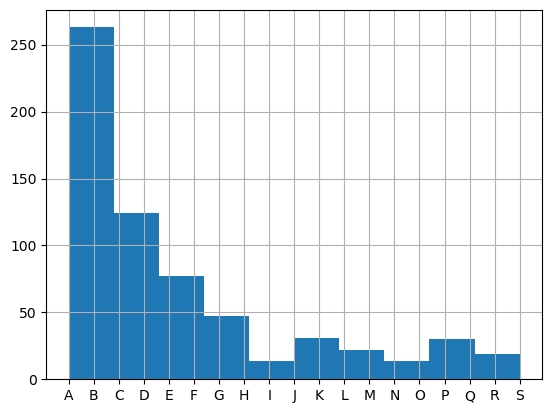

In [51]:
# Classify...
# data.classifyFits(bins = [0.01991154792, 0.019911548,20])
# data.classifyFits(bins = [0.01991154792, 0.01991154793,20])   # Slice best fit region
data.classifyFits(bins = [0.019804186942, 0.01980418697,20])   # Slice best fit region
# data.classifyFits(bins = [*binRange, 20])

## Examine trial parameter sets

In [52]:
# Correct magnitudes (renorm) and phases (to ref)
data.phaseCorrection()

*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
Set ref param = PU_SG_PU_1_1_n1_1


Param                 PU_SG_PU_1_1_n1_1  PU_SG_PU_1_n1_1_1  PU_SG_PU_3_1_n1_1  \
Fit Type redchiGroup                                                            
0   m    E                     1.771928           1.771928           0.830945   
    n    E                     0.290537           0.290537           0.136247   
    p    E                    -0.861041          -0.861041           1.018645   
    pc   E                    -0.861041          -0.861041           1.018645   
2   m    B                     4.695653           4.695653           2.201952   
...                                 ...                ...                ...   
996 pc   B                    -0.861041          -0.861041          -2.740728   
998 m    I                     1.562246           1.562246           0.732626   
    n    I                     0.295854           0.295854           0.138743   
    p    I                    -0.861041          -0.861041          -2.740727   
    pc   I                    -0.861041          -0.861041          -2.740727   

Param                 PU_SG_PU_3_n1_1_1  SU_SG_SU_1_0_0_1  SU_SG_SU_3_0_0_1  
Fit Type redchiGroup                                                         
0   m    E                     0.830945          4.986125          2.161857  
    n    E                     0.136247          0.817557          0.354472  
    p    E                     1.018645          0.777926         -2.888186  
    pc   E                     1.018645          0.777926         -2.888186  
2   m    B                     2.201952          4.956811          2.149144  
...                                 ...               ...               ...  
996 pc   B                    -2.740728         -2.176238          0.440835  
998 m    I                     0.732626          4.296351          1.862785  
    n    I                     0.138743          0.813631          0.352769  
    p    I                    -2.740727          3.123349         -0.542763  
    pc   I                    -2.740727          3.123349         -0.542763  

[2564 rows x 6 columns]

In [53]:
# Test best group, normalized magnitudes
plotGroup = 'A'
data.paramPlot(selectors={'Type':'n', 'redchiGroup':plotGroup}, hue = 'redchi', backend='hv', hvType='violin', remap = 'lmMap', hRound = 30)  # New form with dict

*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.


:Overlay
   .Violin.I  :Violin   [Param]   (value)
   .Scatter.I :Scatter   [Param]   (value,redchi)

In [54]:
# Test best group, corrected phases
data.paramPlot(selectors={'Type':'pc', 'redchiGroup':plotGroup}, hue = 'redchi', backend='hv', hvType='violin', remap = 'lmMap', hRound = 30)  # New form with dict

*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.


:Overlay
   .Violin.I  :Violin   [Param]   (value)
   .Scatter.I :Scatter   [Param]   (value,redchi)

Based on these plots, in this case we can conclude:

- There is some spread in the retrieved normalised magnitudes, but there are preferred regions of solution space, although the m=0 paramters are less well defined.
- The sign of the phases was also undefined in this case (this is in line with the AF reconstruction procedure).
- The relative phase between the $\sigma_u$ continuum (m=0), and the $\pi_u$ continuum is undefined in this case, which is due to a lack of cross-terms between continua in this case.

Overall, it seems like there is the expected level of convergence, and that the matrix elements were constrained as expect, with only *relative* magnitudes and phases obtained (per continuum) in this manner.

The values can be inspected a little more carefully by forcing the phases to abs values (i.e. $0:\pi$ range), and comparing the normalized and phase-corrected values with the known inputs...


In [55]:
data.phaseCorrection(absFlag=True, useRef = False)  # Recompute phase corrections without reference shift & using 0:pi only
data.paramPlot(selectors={'Type':'pc', 'redchiGroup':plotGroup}, hue = 'redchi', backend='hv', hvType='violin', remap = 'lmMap', hRound = 30)  # New form with dict

*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
Set ref param = PU_SG_PU_1_1_n1_1


Param                 PU_SG_PU_1_1_n1_1  PU_SG_PU_1_n1_1_1  PU_SG_PU_3_1_n1_1  \
Fit Type redchiGroup                                                            
0   m    E                     1.771928           1.771928           0.830945   
    n    E                     0.290537           0.290537           0.136247   
    p    E                    -0.861041          -0.861041           1.018645   
    pc   E                     0.000000           0.000000           1.879686   
2   m    B                     4.695653           4.695653           2.201952   
...                                 ...                ...                ...   
996 pc   B                     0.000000           0.000000           1.879686   
998 m    I                     1.562246           1.562246           0.732626   
    n    I                     0.295854           0.295854           0.138743   
    p    I                    -0.861041          -0.861041          -2.740727   
    pc   I                     0.000000           0.000000           1.879686   

Param                 PU_SG_PU_3_n1_1_1  SU_SG_SU_1_0_0_1  SU_SG_SU_3_0_0_1  
Fit Type redchiGroup                                                         
0   m    E                     0.830945          4.986125          2.161857  
    n    E                     0.136247          0.817557          0.354472  
    p    E                     1.018645          0.777926         -2.888186  
    pc   E                     1.879686          1.638968          2.027144  
2   m    B                     2.201952          4.956811          2.149144  
...                                 ...               ...               ...  
996 pc   B                     1.879686          1.315196          1.301877  
998 m    I                     0.732626          4.296351          1.862785  
    n    I                     0.138743          0.813631          0.352769  
    p    I                    -2.740727          3.123349         -0.542763  
    pc   I                     1.879686          2.298795          0.318278  

[2564 rows x 6 columns]

*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.


:Overlay
   .Violin.I  :Violin   [Param]   (value)
   .Scatter.I :Scatter   [Param]   (value,redchi)

In [56]:
# Get parameter statistics & compare with ref

# Specify subselection criteria with a dictionary of selectors (currently uses index values only) & report
data.paramsReport(inds = {'redchiGroup':plotGroup})
data.paramsCompare()

# Final comparison with formatting
import pandas as pd
# pd.options.display.precision = 5
pd.options.display.float_format = '{:.4f}'.format
data.paramsSummaryComp

*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
Set ref param = PU_SG_PU_1_1_n1_1


Param     PU_SG_PU_1_1_n1_1  PU_SG_PU_1_n1_1_1  PU_SG_PU_3_1_n1_1  \
Fit Type                                                            
ref m              0.279818           0.279818           0.553700   
    n              0.206901           0.206901           0.409412   
    p             -0.861041          -0.861041           0.754917   
    pc             0.000000           0.000000           1.615958   

Param     PU_SG_PU_3_n1_1_1  SU_SG_SU_1_0_0_1  SU_SG_SU_3_0_0_1  
Fit Type                                                         
ref m              0.553700          0.693892          0.760136  
    n              0.409412          0.513072          0.562053  
    p              0.754917          0.599562          0.862146  
    pc             1.615958          1.460603          1.723187

C:\Users\femtolab\.conda\envs\ePSdev\lib\site-packages\IPython\core\interactiveshell.py:2886: PerformanceWarning: indexing past lexsort depth may impact performance.
  return runner(coro)


Param                PU_SG_PU_1_1_n1_1  PU_SG_PU_1_n1_1_1  PU_SG_PU_3_1_n1_1  \
Type Source   dType                                                            
m    mean     num               2.9271             2.9271             1.3726   
     ref      num               0.2798             0.2798             0.5537   
     diff     %                90.4405            90.4405            59.6610   
              num               2.6473             2.6473             0.8189   
     std      %                60.7753            60.7753            60.7753   
              num               1.7790             1.7790             0.8342   
     diff/std %               148.8113           148.8113            98.1664   
n    mean     num               0.4920             0.4920             0.2307   
     ref      num               0.2069             0.2069             0.4094   
     diff     %                57.9463            57.9463            77.4567   
              num               0.2851             0.2851            -0.1787   
     std      %                35.7950            35.7950            35.7950   
              num               0.1761             0.1761             0.0826   
     diff/std %               161.8840           161.8840           216.3898   
p    mean     num              -0.8610            -0.8610             0.0340   
     ref      num              -0.8610            -0.8610             0.7549   
     diff     %                 0.0000             0.0000          2117.2601   
              num              -0.0000            -0.0000            -0.7209   
     std      %                 0.0000             0.0000          4913.5282   
              num               0.0000             0.0000             1.6729   
     diff/std %                    inf                inf            43.0904   
pc   mean     num               0.0000             0.0000             1.8797   
     ref      num               0.0000             0.0000             1.6160   
     diff     %                    nan                nan            14.0304   
              num               0.0000             0.0000             0.2637   
     std      %                    nan                nan             0.0000   
              num               0.0000             0.0000             0.0000   
     diff/std %                    nan                nan     521349978.3748   

Param                PU_SG_PU_3_n1_1_1  SU_SG_SU_1_0_0_1  SU_SG_SU_3_0_0_1  
Type Source   dType                                                         
m    mean     num               1.3726            2.4727            1.0721  
     ref      num               0.5537            0.6939            0.7601  
     diff     %                59.6610           71.9377           29.0978  
              num               0.8189            1.7788            0.3120  
     std      %                60.7753           78.9698           78.9698  
              num               0.8342            1.9527            0.8466  
     diff/std %                98.1664           91.0952           36.8467  
n    mean     num               0.2307            0.4436            0.1924  
     ref      num               0.4094            0.5131            0.5621  
     diff     %                77.4567           15.6510          192.2033  
              num              -0.1787           -0.0694           -0.3697  
     std      %                35.7950           66.7682           66.7683  
              num               0.0826            0.2962            0.1284  
     diff/std %               216.3898           23.4407          287.8663  
p    mean     num               0.0340            0.6758           -0.3214  
     ref      num               0.7549            0.5996            0.8621  
     diff     %              2117.2601           11.2857          368.2397  
              num              -0.7209            0.0763           -1.1836  
     std      %              4913.5282          314.8800   

These results follow from the conclusions above, with some additional caveats:

- The fitted normalised magnitudes are excellent for $\pi_u, l=1$, but less good for other cases (row type 'n', compared mean and ref values).
- The fitted phases ('pc') are generally very good. Interestingly the $\sigma_u$ mean phases look reasonable here, although this may just be a statistical artefact, since we expect a loss of relative phase information between the continua, as seen in the plots above. However, by setting these values as the reference case we should find a low spread of results (just uncorrelated with the $\pi_u$ case).

In [57]:
# Test sigma_u continua by setting different reference phase...
phaseCorrParams={'absFlag':True, 'useRef':False, 'refParam':'SU_SG_SU_1_0_0_1'}
# data.phaseCorrection(absFlag=True, useRef = False, refParam = 'SU_SG_SU_1_0_0_1')  # Recompute phase corrections without reference shift & using 0:pi only
data.phaseCorrection(**phaseCorrParams)
data.paramPlot(selectors={'Type':'pc', 'redchiGroup':plotGroup}, hue = 'redchi', backend='hv', hvType='violin', remap = 'lmMap', hRound = 30)  # New form with dict

# Specify subselection criteria with a dictionary of selectors (currently uses index values only) & report
data.paramsReport(inds = {'redchiGroup':plotGroup})
data.paramsCompare(phaseCorrParams=phaseCorrParams)

# Final comparison with formatting
import pandas as pd
# pd.options.display.precision = 5
pd.options.display.float_format = '{:.4f}'.format
data.paramsSummaryComp

*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
Set ref param = SU_SG_SU_1_0_0_1


Param                 PU_SG_PU_1_1_n1_1  PU_SG_PU_1_n1_1_1  PU_SG_PU_3_1_n1_1  \
Fit Type redchiGroup                                                            
0   m    E                       1.7719             1.7719             0.8309   
    n    E                       0.2905             0.2905             0.1362   
    p    E                      -0.8610            -0.8610             1.0186   
    pc   E                       1.6390             1.6390             0.2407   
2   m    B                       4.6957             4.6957             2.2020   
...                                 ...                ...                ...   
996 pc   B                       1.3152             1.3152             0.5645   
998 m    I                       1.5622             1.5622             0.7326   
    n    I                       0.2959             0.2959             0.1387   
    p    I                      -0.8610            -0.8610            -2.7407   
    pc   I                       2.2988             2.2988             0.4191   

Param                 PU_SG_PU_3_n1_1_1  SU_SG_SU_1_0_0_1  SU_SG_SU_3_0_0_1  
Fit Type redchiGroup                                                         
0   m    E                       0.8309            4.9861            2.1619  
    n    E                       0.1362            0.8176            0.3545  
    p    E                       1.0186            0.7779           -2.8882  
    pc   E                       0.2407            0.0000            2.6171  
2   m    B                       2.2020            4.9568            2.1491  
...                                 ...               ...               ...  
996 pc   B                       0.5645            0.0000            2.6171  
998 m    I                       0.7326            4.2964            1.8628  
    n    I                       0.1387            0.8136            0.3528  
    p    I                      -2.7407            3.1233           -0.5428  
    pc   I                       0.4191            0.0000            2.6171  

[2564 rows x 6 columns]

*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.


:Overlay
   .Violin.I  :Violin   [Param]   (value)
   .Scatter.I :Scatter   [Param]   (value,redchi)

*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
*** Warning: found MultiIndex for DataFrame data.index - checkDims may have issues with Pandas MultiIndex, but will try anyway.
Set ref param = SU_SG_SU_1_0_0_1


Param     PU_SG_PU_1_1_n1_1  PU_SG_PU_1_n1_1_1  PU_SG_PU_3_1_n1_1  \
Fit Type                                                            
ref m                0.2798             0.2798             0.5537   
    n                0.2069             0.2069             0.4094   
    p               -0.8610            -0.8610             0.7549   
    pc               1.4606             1.4606             0.1554   

Param     PU_SG_PU_3_n1_1_1  SU_SG_SU_1_0_0_1  SU_SG_SU_3_0_0_1  
Fit Type                                                         
ref m                0.5537            0.6939            0.7601  
    n                0.4094            0.5131            0.5621  
    p                0.7549            0.5996            0.8621  
    pc               0.1554            0.0000            0.2626

C:\Users\femtolab\.conda\envs\ePSdev\lib\site-packages\IPython\core\interactiveshell.py:2886: PerformanceWarning: indexing past lexsort depth may impact performance.
  return runner(coro)


Param                PU_SG_PU_1_1_n1_1  PU_SG_PU_1_n1_1_1  PU_SG_PU_3_1_n1_1  \
Type Source   dType                                                            
m    mean     num               2.9271             2.9271             1.3726   
     ref      num               0.2798             0.2798             0.5537   
     diff     %                90.4405            90.4405            59.6610   
              num               2.6473             2.6473             0.8189   
     std      %                60.7753            60.7753            60.7753   
              num               1.7790             1.7790             0.8342   
     diff/std %               148.8113           148.8113            98.1664   
n    mean     num               0.4920             0.4920             0.2307   
     ref      num               0.2069             0.2069             0.4094   
     diff     %                57.9463            57.9463            77.4567   
              num               0.2851             0.2851            -0.1787   
     std      %                35.7950            35.7950            35.7950   
              num               0.1761             0.1761             0.0826   
     diff/std %               161.8840           161.8840           216.3898   
p    mean     num              -0.8610            -0.8610             0.0340   
     ref      num              -0.8610            -0.8610             0.7549   
     diff     %                 0.0000             0.0000          2117.2601   
              num              -0.0000            -0.0000            -0.7209   
     std      %                 0.0000             0.0000          4913.5282   
              num               0.0000             0.0000             1.6729   
     diff/std %                    inf                inf            43.0904   
pc   mean     num               1.9511             1.9511             1.3527   
     ref      num               1.4606             1.4606             0.1554   
     diff     %                25.1386            25.1386            88.5148   
              num               0.4905             0.4905             1.1973   
     std      %                36.5002            36.5002            71.7079   
              num               0.7121             0.7121             0.9700   
     diff/std %                68.8724            68.8724           123.4380   

Param                PU_SG_PU_3_n1_1_1  SU_SG_SU_1_0_0_1  SU_SG_SU_3_0_0_1  
Type Source   dType                                                         
m    mean     num               1.3726            2.4727            1.0721  
     ref      num               0.5537            0.6939            0.7601  
     diff     %                59.6610           71.9377           29.0978  
              num               0.8189            1.7788            0.3120  
     std      %                60.7753           78.9698           78.9698  
              num               0.8342            1.9527            0.8466  
     diff/std %                98.1664           91.0952           36.8467  
n    mean     num               0.2307            0.4436            0.1924  
     ref      num               0.4094            0.5131            0.5621  
     diff     %                77.4567           15.6510          192.2033  
              num              -0.1787           -0.0694           -0.3697  
     std      %                35.7950           66.7682           66.7683  
              num               0.0826            0.2962            0.1284  
     diff/std %               216.3898           23.4407          287.8663  
p    mean     num               0.0340            0.6758           -0.3214  
     ref      num               0.7549            0.5996            0.8621  
     diff     %              2117.2601           11.2857          368.2397  
              num              -0.7209            0.0763           -1.1836  
     std      %              4913.5282          314.8800   

This again reflects a converged fit result, but a lack of correlation with the other continua. Additionally, the lack of sign on the phase has resulted in a phase-corrected value of 2.6, which is close to $\pi-0.6$, i.e. $\pi$ - (reference phase). In this case care must be taken in evaluation of the results!  Adding a diagonal polarization case would fix most of these issue, by providing an observable sensitive to the phase relation *between* the continua.

## Versions

In [58]:
import scooby
scooby.Report(additional=['epsproc', 'pemtk', 'xarray', 'jupyter'])

--------------------------------------------------------------------------------
  Date: Tue Sep 13 13:45:45 2022 Eastern Daylight Time

                OS : Windows
            CPU(s) : 32
           Machine : AMD64
      Architecture : 64bit
               RAM : 63.9 GB
       Environment : Jupyter

  Python 3.7.3 (default, Apr 24 2019, 15:29:51) [MSC v.1915 64 bit (AMD64)]

           epsproc : 1.3.2-dev
             pemtk : 0.0.1
            xarray : 0.15.0
           jupyter : Version unknown
             numpy : 1.18.1
             scipy : 1.3.0
           IPython : 7.12.0
        matplotlib : 3.3.1
            scooby : 0.5.6

  Intel(R) Math Kernel Library Version 2020.0.0 Product Build 20191125 for
  Intel(R) 64 architecture applications
--------------------------------------------------------------------------------

In [59]:
# Check current Git commit for local ePSproc version
from pathlib import Path
!git -C {Path(ep.__file__).parent} branch
!git -C {Path(ep.__file__).parent} log --format="%H" -n 1

* dev
  master
  numba-tests
815a839f3c8c4995532d6b5f87997b8ba2bb12eb


In [60]:
# Check current remote commits
!git ls-remote --heads https://github.com/phockett/ePSproc
# !git ls-remote --heads git://github.com/phockett/epsman

92c661789a7d2927f2b53d7266f57de70b3834fa	refs/heads/dependabot/pip/notes/envs/envs-versioned/mistune-2.0.3
fe1e9540c7b91fe571f60562acd31d8e489d491e	refs/heads/dependabot/pip/notes/envs/envs-versioned/nbconvert-6.5.1
815a839f3c8c4995532d6b5f87997b8ba2bb12eb	refs/heads/dev
1c0b8fd409648f07c85f4f20628b5ea7627e0c4e	refs/heads/master
69cd89ce5bc0ad6d465a4bd8df6fba15d3fd1aee	refs/heads/numba-tests
ea30878c842f09d525fbf39fa269fa2302a13b57	refs/heads/revert-9-master


In [61]:
# Check current Git commit for local PEMtk version
import pemtk
from pathlib import Path
!git -C {Path(pemtk.__file__).parent} branch
!git -C {Path(pemtk.__file__).parent} log --format="%H" -n 1

* master
  mfFittingDev
789b51ca06aa3b6b66123b27342be8b90f8d6a04


In [62]:
# Check current remote commits
!git ls-remote --heads https://github.com/phockett/PEMtk
# !git ls-remote --heads git://github.com/phockett/epsman

aca9bc06bee4ab16dbe3d30a5b1e1b5604f975c5	refs/heads/master
3f4686dffdbb310f15692f978ba36d6a3d15e8d3	refs/heads/mfFittingDev
